<a href="https://colab.research.google.com/github/naenumtou/dataScienceLab/blob/main/twitterIO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Set auto reload
%reload_ext autoreload
%autoreload 2

In [ ]:
# Install PyThaiNLP
!pip install --upgrade pythainlp

In [ ]:
# Import libraries
import pandas as pd
import re
import string
import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pythainlp.corpus.common import thai_stopwords
from pythainlp.tokenize import sent_tokenize, word_tokenize
from collections import Counter
from wordcloud import WordCloud

%config InlineBackend.figure_format = 'retina'

# Change directory to Google Drive
%cd /content/drive/My Drive/Colab Notebooks

/content/drive/My Drive/Colab Notebooks


In [ ]:
# Import dataset
df = pd.read_csv('https://raw.githubusercontent.com/naenumtou/statisticalModel/main/datasets/twitterIOTweets.csv',
                 parse_dates = ['account_creation_date', 'tweet_time'], dayfirst = False)

# Keep only useful information
df = df[['follower_count',
         'following_count',
         'account_creation_date',
         'tweet_text',
         'tweet_time',
         'tweet_client_name']]

# Sample dataset
df.sample(5)

,follower_count,following_count,account_creation_date,tweet_text,tweet_time,tweet_client_name
10198,25,64,2020-01-08,RT @vnomenon: อุทยานแห่งชาติภูกระดึง จ. เลย ที...,2020-02-19 01:52:00,Twitter Web App
9527,4,138,2020-01-14,@BTS_SkyTrain ดีครับ ได้ทั้งความรู้ และเมื่อน้...,2020-02-18 05:51:00,Twitter Web App
3841,3,63,2019-12-07,@kovitw1 สักเรื่องได้มั้ยครับ ที่จะไม่แซะประเท...,2020-01-30 06:39:00,Twitter Web App
15261,1,7,2019-12-24,@army2pr ขอชื่นชมครับ,2020-02-07 04:32:00,Twitter Web App
3872,0,12,2019-12-06,@HoaJuy @HAMA83837526 @WassanaNanuam งั้นมืงก็...,2019-12-31 04:04:00,Twitter Web App


In [ ]:
# Clean tweet text
# Define emoji Unicode first
emoji = re.compile("["
                   u"\U0001F600-\U0001F64F"  #Emoticons
                   u"\U0001F300-\U0001F5FF"  #Symbols & pictographs
                   u"\U0001F680-\U0001F6FF"  #Transport & map symbols
                   u"\U0001F1E0-\U0001F1FF"  #Flags (iOS)
                   u"\U00002500-\U00002BEF"  #Chinese char
                   u"\U00002702-\U000027B0"
                   u"\U00002702-\U000027B0"
                   u"\U000024C2-\U0001F251"
                   u"\U0001f926-\U0001f937"
                   u"\U00010000-\U0010ffff"
                   u"\u2640-\u2642"
                   u"\u2600-\u2B55"
                   u"\u200d"
                   u"\u23cf"
                   u"\u23e9"
                   u"\u231a"
                   u"\ufe0f"  #Dingbats
                   u"\u3030"
                   "]+", flags = re.UNICODE) #Flag option as Unicode

# Define function for text cleansing
def cleanText(text):
  newText = re.sub(r'(?:http|ftp|https)://(?:[\w_-]+(?:(?:\.[\w_-]+)+))(?:[\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '', text) #Remove link
  newText = re.sub(emoji, '', newText) #Remove emoji
  newText = re.sub(r'@([a-zA-Z0-9_]{1,50})', '', newText) #Remove @username
  newText = re.sub(r'#([a-zA-Z0-9ก-๙_]+)', '', newText) #Remove hashtag
  newText = re.sub(r'RT', '', newText) #Remove 'RT' Word from tweet
  newText = newText.translate(str.maketrans('', '', string.punctuation)) #Remove punctuation
  newText = ' '.join(newText.split()) #Keep only one white space
  return newText

In [ ]:
# Apply function to clean tweet
df['cleanTweet'] = df['tweet_text'].apply(cleanText)

# Sample dataset
df.sample(5)

,follower_count,following_count,account_creation_date,tweet_text,tweet_time,tweet_client_name,cleanTweet
11926,3,10,2019-12-06,RT @Piyabutr_FWP: ชมด่วน! #ประชุมสภา ปิยบุตรอภ...,2020-02-18 02:24:00,Twitter for iPhone,ชมด่วน ปิยบุตรอภิปรายเรื่องคำวินิจฉัยศาลรัฐธรร...
6079,2,28,2019-12-04,RT @irichmillion: พี่คนไทยโปรญี่ปุ่นบางคนแกโกร...,2020-02-18 07:33:00,Twitter Web App,พี่คนไทยโปรญี่ปุ่นบางคนแกโกรธว่าทำไมยอดคนติดเช...
7468,6,33,2019-11-05,RT @SMARTSSArmy: ชีวิตต้องเดินหน้าต่อไปครับ\n\...,2020-01-14 08:02:00,Twitter for Android,ชีวิตต้องเดินหน้าต่อไปครับ
1114,1,2,2019-12-06,#ขบวนพยุหยาตราทางชลมารค \nแปะไว้ในความทรงจำ,2019-12-13 03:31:00,Twitter for Android,แปะไว้ในความทรงจำ
1085,5,42,2020-01-14,เป้นภาพที่สุดยอดมากเลย,2020-02-13 09:05:00,Twitter Web App,เป้นภาพที่สุดยอดมากเลย


In [ ]:
# Extacting information
# Define function for extracting information
def extractUser(text):
  extract = re.findall(r'@([a-zA-Z0-9_]{1,50})', text)
  users = [user for user in extract if len(user) <= 20] #Keep less than 20 characters for @username
  return users

def extractTag(text):
  extract = re.findall(r'#([a-zA-Z0-9ก-๙_]+)', text)
  return extract

In [ ]:
# Apply function to extract username
df['mention'] = df['tweet_text'].apply(extractUser)

# Apply function to extract username
df['hashtag'] = df['tweet_text'].apply(extractTag)

# Sample dataset
df.sample(5)

,follower_count,following_count,account_creation_date,tweet_text,tweet_time,tweet_client_name,cleanTweet,mention,hashtag
8923,12,99,2019-12-07,@112233Demm มันเป็นสิ่งล้ำค่า ที่เราไม่เคยเห็น...,2019-12-13 02:35:00,Twitter Web App,มันเป็นสิ่งล้ำค่า ที่เราไม่เคยเห็นมาก่อน ซึ่งท...,[112233Demm],[]
17151,2,7,2020-01-10,RT @armypr_news: กรมพลาธิการทหารบก แจงทำตามกระ...,2020-02-07 15:35:00,Twitter Web App,กรมพลาธิการทหารบก แจงทำตามกระบวนการของกระทรวงพ...,[armypr_news],[]
3340,5,36,2019-12-08,@INamKaa ขอแสดงความเสียใจกับครอบครัวของผู้เสีย...,2020-02-11 03:57:00,Twitter Web App,ขอแสดงความเสียใจกับครอบครัวของผู้เสียชีวิตด้วย...,[INamKaa],[]
8371,1,21,2019-12-09,RT @3_INFANTRY_DIV: ถอดบทเรียน 5 ข้อ บันทึกจาก...,2020-02-21 04:06:00,Twitter for iPhone,ถอดบทเรียน 5 ข้อ บันทึกจากแนวรบ แอร์วิน รอมเมิ...,[3_INFANTRY_DIV],[ก]
16860,0,38,2019-12-09,"RT @VoiceTVOfficial: ""สิระ"" จวก ""ปิยบุตร"" เห็น...",2020-01-03 01:46:00,Twitter for Android,สิระ จวก ปิยบุตร เห็นแก่ตัว ปั่นหัว ปชชหวังลาก...,[VoiceTVOfficial],[]


In [ ]:
# Factor creation
# Account creation month
df['monthCreate'] = df['account_creation_date'].dt.to_period('M') #Change to month level

# Tweet time
df['dateTweet'] = df['tweet_time'].dt.date #Convert to datetime format
df['monthTweet'] = df['tweet_time'].dt.to_period('M') #Change to month level

df['dayTweet'] = df['tweet_time'].dt.day_name()
condition = df['dayTweet'].isin(['Saturday', 'Sunday'])
df['dayWorking'] = np.where(condition, 'Weekend', 'Weekday') #Find working days

df['timeTweet'] = df['tweet_time'].dt.round('H').dt.strftime('%H:%M') #Round to hours

# Sample dataset
df.sample(5)

,follower_count,following_count,account_creation_date,tweet_text,tweet_time,tweet_client_name,cleanTweet,mention,hashtag,monthCreate,dateTweet,monthTweet,dayTweet,dayWorking,timeTweet
7029,6,33,2019-11-05,RT @paisalvision: ด่วน ในหลวงโปรดเกล้าพระราชทา...,2019-12-27 04:49:00,Twitter Web App,ด่วน ในหลวงโปรดเกล้าพระราชทานอภัยโทษ และใบประก...,[paisalvision],[],2019-11,2019-12-27,2019-12,Friday,Weekday,05:00
4620,3,10,2019-12-06,RT @TanwarinS: ประชุมสภาวันนี้​ มีแถลงข่าวกับค...,2020-02-16 01:27:00,Twitter for iPhone,ประชุมสภาวันนี้​ มีแถลงข่าวกับคณะกรรมาธิ​การ​ศ...,[TanwarinS],[],2019-12,2020-02-16,2020-02,Sunday,Weekend,01:00
1086,14,93,2019-12-09,อยากนอนซักสองเดือนเนอะ ^^,2020-01-08 09:35:00,Twitter Web App,อยากนอนซักสองเดือนเนอะ,[],[],2019-12,2020-01-08,2020-01,Wednesday,Weekday,10:00
13443,1,23,2019-12-08,@Army4PR เป็นกำลังใจให้ทหารรบพิเศษทุกนายครับ,2020-02-24 04:29:00,Twitter for Android,เป็นกำลังใจให้ทหารรบพิเศษทุกนายครับ,[Army4PR],[],2019-12,2020-02-24,2020-02,Monday,Weekday,04:00
14066,0,12,2019-12-23,RT @weloverta: พระบาทสมเด็จพระเจ้าอยู่หัว ทรงพ...,2020-02-25 03:59:00,Twitter for Android,พระบาทสมเด็จพระเจ้าอยู่หัว ทรงพระกรุณาโปรดเกล้...,[weloverta],[],2019-12,2020-02-25,2020-02,Tuesday,Weekday,04:00


In [ ]:
# Visualisation
# Define plot function
def plotTweet(input, xValue, hueOption, title, xLabel, yLabel):
  plt.figure(figsize = (10, 6))
  with plt.style.context('seaborn'):
    ax = sns.countplot(x = xValue, data = input, hue = hueOption,
                     order = input[xValue].sort_values().unique(),
                     palette = 'viridis')
    ax.set_title(title)
    ax.set(xlabel = xLabel, ylabel = yLabel)
    plt.xticks(rotation = 90)
    plt.savefig(f'{title}.png')
  return plt.show()

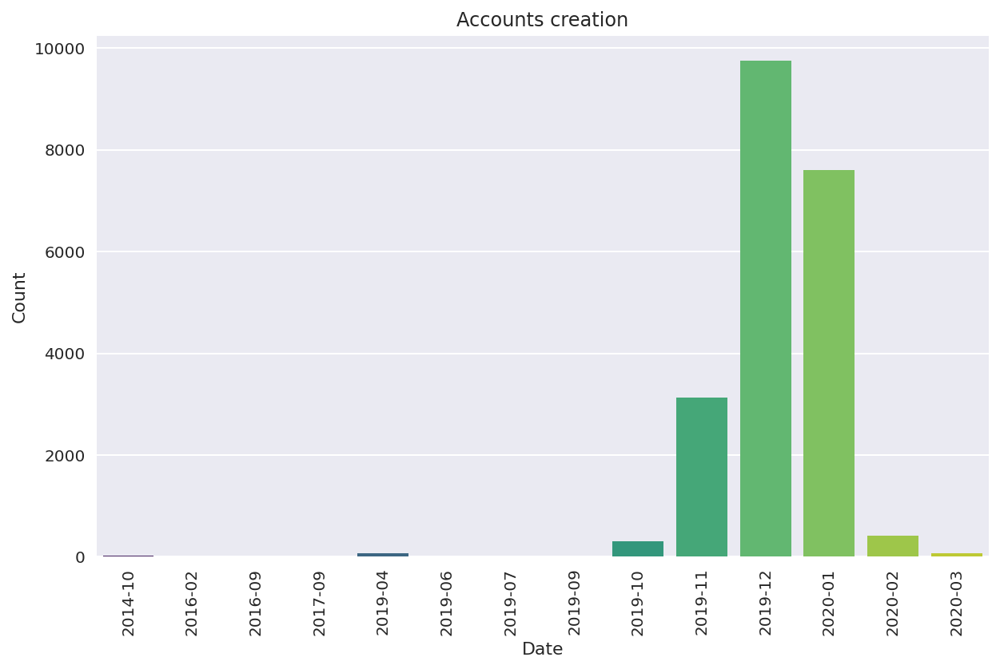

In [ ]:
# Account creation
plotTweet(df, 'monthCreate', None, 'Accounts creation', 'Date', 'Count')

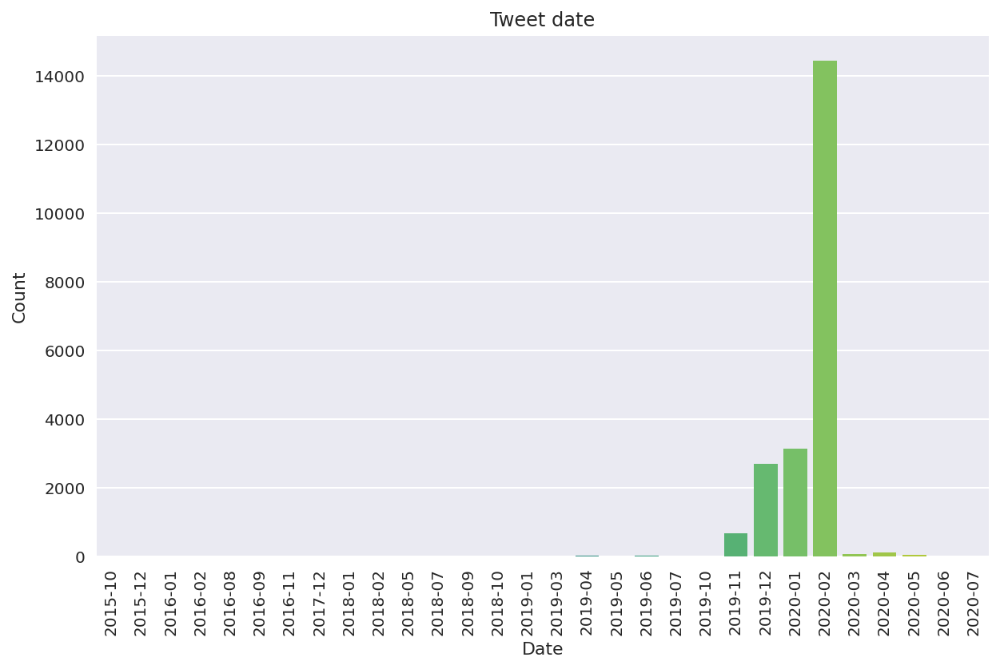

In [ ]:
# Tweet date
plotTweet(df, 'monthTweet', None, 'Tweet date', 'Date', 'Count')

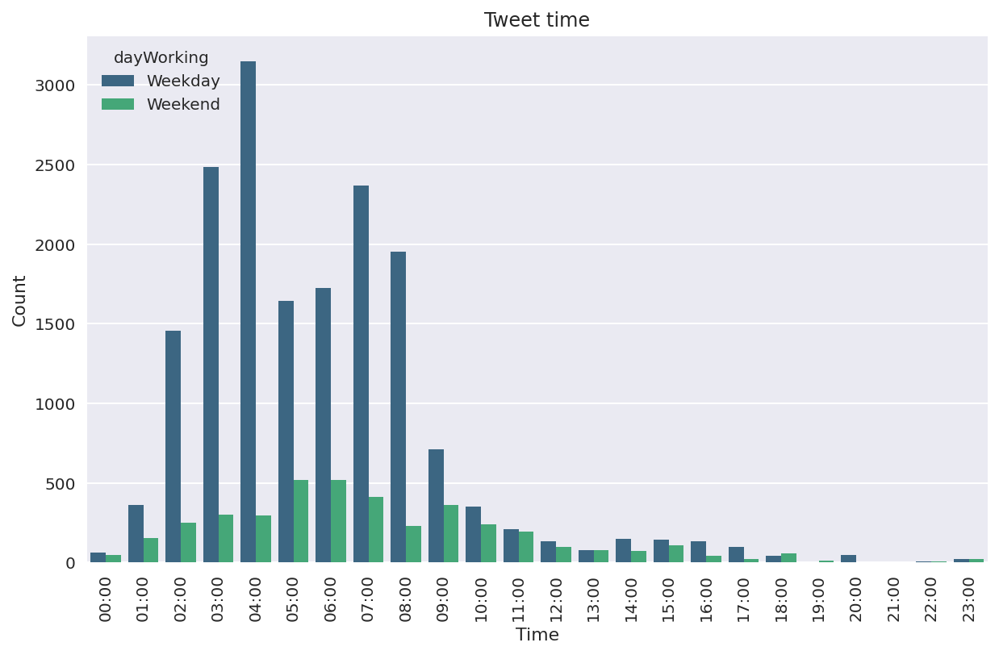

In [ ]:
# Tweet time
plotTweet(df, 'timeTweet', 'dayWorking', 'Tweet time', 'Time', 'Count')

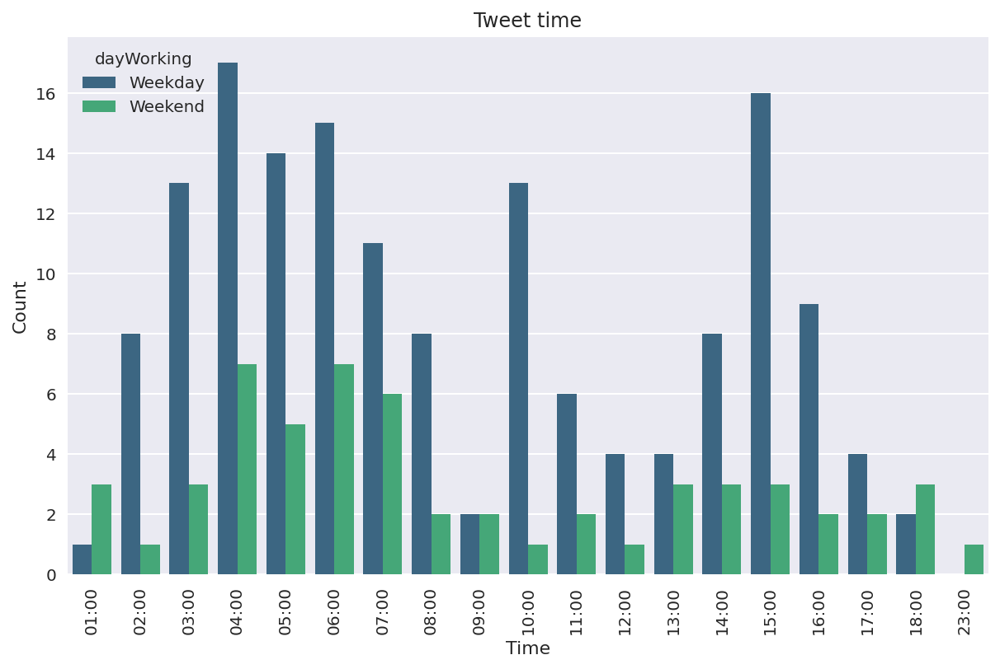

In [ ]:
# 1-Day average tweet time
# Sample 1-Day each
daySample = []

for day in ['Weekday', 'Weekend']:
  sample = df[df['dayWorking'] == day].groupby(['dateTweet'])['timeTweet'].apply(lambda x: x.sample(1)).reset_index()
  sample['dayWorking'] = day
  daySample.append(sample)

daySample = pd.concat(daySample, axis = 0)

# Plot
plotTweet(daySample, 'timeTweet', 'dayWorking', 'Tweet time', 'Time', 'Count')

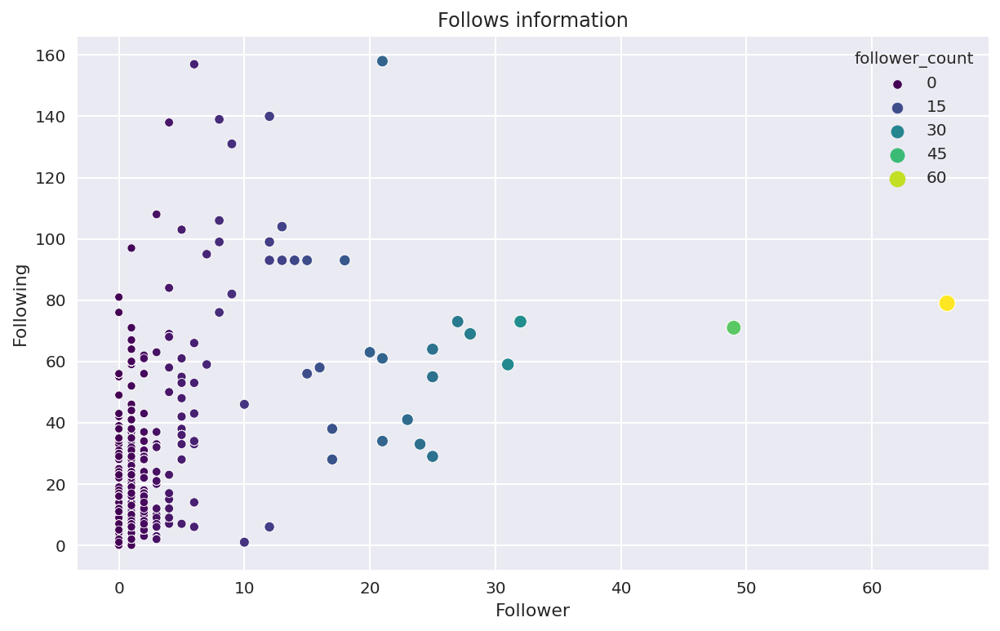

In [ ]:
# Following and follower
plt.figure(figsize = (10, 6))
with plt.style.context('seaborn'):
  ax = sns.scatterplot(x = 'follower_count', y = 'following_count', 
                     data = df,
                     hue = 'follower_count',
                     size = 'follower_count',
                     palette = 'viridis')
  ax.set_title('Follows information')
  ax.set(xlabel = 'Follower', ylabel = 'Following')
  plt.savefig('followsInformation.png')
plt.show()

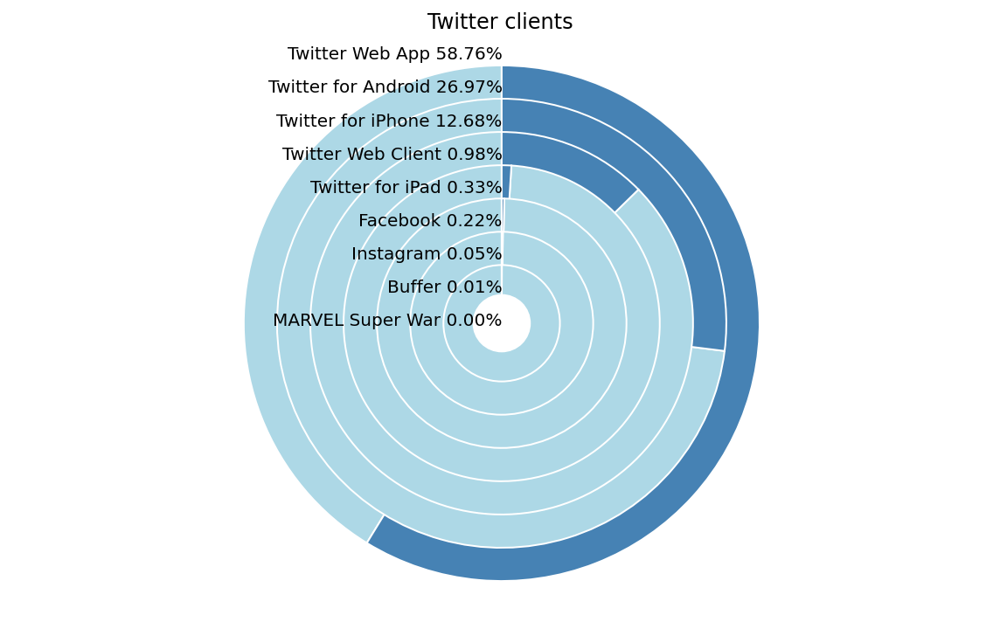

In [ ]:
# Tweet client
# Create data
client = pd.DataFrame(df['tweet_client_name'].value_counts(dropna = False)).reset_index()
client = client.rename(columns = {'index': 'twitterClient'})
client['twitterClient'] =  client['twitterClient'].apply(lambda x: re.sub(r'[^a-zA-Z\s+]', '', x)) #Clean twitter client
client['Percentage'] = client['tweet_client_name'].transform(lambda x: x / x.sum()) #Change to percentage
client = client.drop(['tweet_client_name'], axis = 1)

# Create donut plot
plt.figure(figsize = (10, 6))
plt.title('Twitter clients')
startingRadius = 0.7 + (0.3 * (client.shape[0] - 1))
for index, row in client.iterrows():
  clientUsed, percentage = row['twitterClient'], row['Percentage']
  label = f'{clientUsed} {percentage * 100:.2f}%'
  sizeDonut = [1 - percentage, percentage]
  
  
  plt.text(0.01, startingRadius + 0.07, label,
           horizontalalignment = 'right')
  plt.pie(sizeDonut, radius = startingRadius,
          startangle = 90, colors = ['lightblue', 'steelblue'],
          wedgeprops = {'edgecolor': 'white', 'linewidth': 1})
  startingRadius -= 0.4

plt.axis('equal')

# create circle and place onto pie chart
circle = plt.Circle(xy = (0, 0), radius = 0.35, facecolor = 'white')
plt.gca().add_artist(circle)
plt.savefig('twitterClient.jpg')
plt.show()

In [ ]:
# Tokenize tweets by sentence
sentences = []

for i, text in enumerate(df['cleanTweet']):
  tokenText = sent_tokenize(text, engine = 'whitespace+newline', keep_whitespace = False)
  sentences.append(tokenText)

sentences = [sentence for sentence in sentences if sentence] #Remove empty list
sentences = [sentence for sublist in sentences for sentence in sublist] #Flatten list

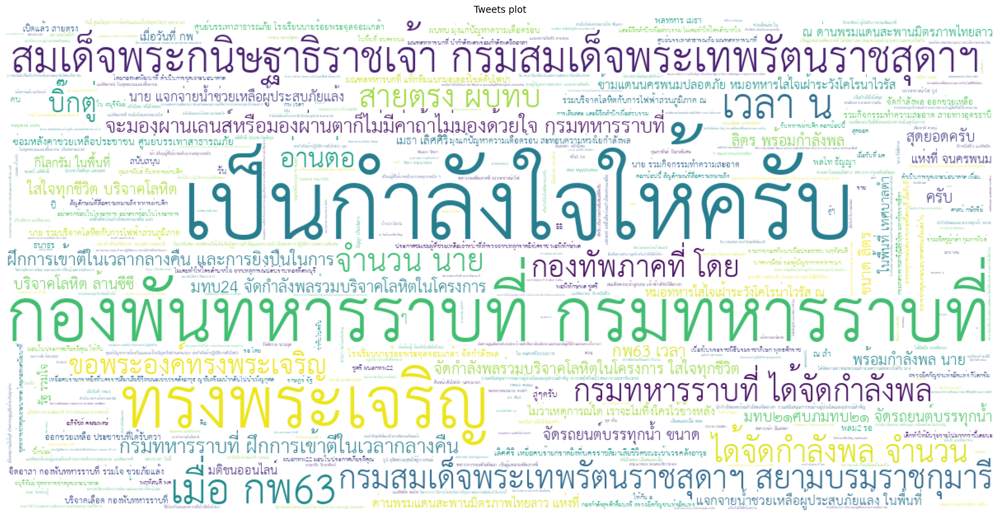

In [ ]:
# Word cloud plot
wordcloud = WordCloud(font_path = 'THSarabunNew.ttf',
                        width = 1200,
                        height = 600,
                        max_words = 1000,
                        background_color = 'white',
                        regexp = r'[0-9ก-๙]+').generate_from_text(' '.join(sentences))
plt.figure(figsize = (18, 10))
plt.axis('off')
plt.title('Tweets plot')
plt.imshow(wordcloud)
plt.tight_layout()
plt.savefig('tweetSenteances.png')
plt.show()

In [ ]:
# Define list adjustment function
def countWord(inputList, n):
  # List adjustment
  inputList = [input for input in inputList if input] #Remove empty list
  inputList = [input for sublist in inputList for input in sublist] #Flatten list

  # Count word frequency
  wordFreq = Counter(inputList)
  return dict(wordFreq.most_common(n)) #Return as dictionary

In [ ]:
# Tokenize tweets by word
stopwords = thai_stopwords()
words = []

for i, text in enumerate(df['cleanTweet']):
  tokenText = word_tokenize(text, engine = 'newmm', keep_whitespace = False)
  tokenText = [word for word in tokenText if not word.isnumeric()] #Remove numeric
  tokenText = [word for word in tokenText if not word in stopwords] #Remove Thai stop words
  tokenText = [word for i, word in enumerate(tokenText) if re.sub(r'[^ก-๙]', '', word)] #Keep only Thai characters
  words.append(tokenText)

  # Print process
  if i % 10000 == 0:
    print(f'Word processing: {i}')

Word processing: 0
Word processing: 10000
Word processing: 20000


In [ ]:
# Define wordcloud function
def plotWord(data, n, namePlot, tweet = True):
  if tweet is True:
    pattern = r'[ก-๙]+'
  else:
    pattern = r'[a-zA-Z0-9ก-๙]+'

  wordcloud = WordCloud(font_path = 'THSarabunNew.ttf',
                        width = 1200,
                        height = 600,
                        max_words = n,
                        background_color = 'white',
                        regexp = pattern).generate_from_frequencies(data)
  plt.figure(figsize = (18, 10))
  plt.axis('off')
  plt.title(f'{namePlot}')
  plt.imshow(wordcloud)
  plt.tight_layout()
  plt.savefig(f'{namePlot}.png')
  return plt.show()

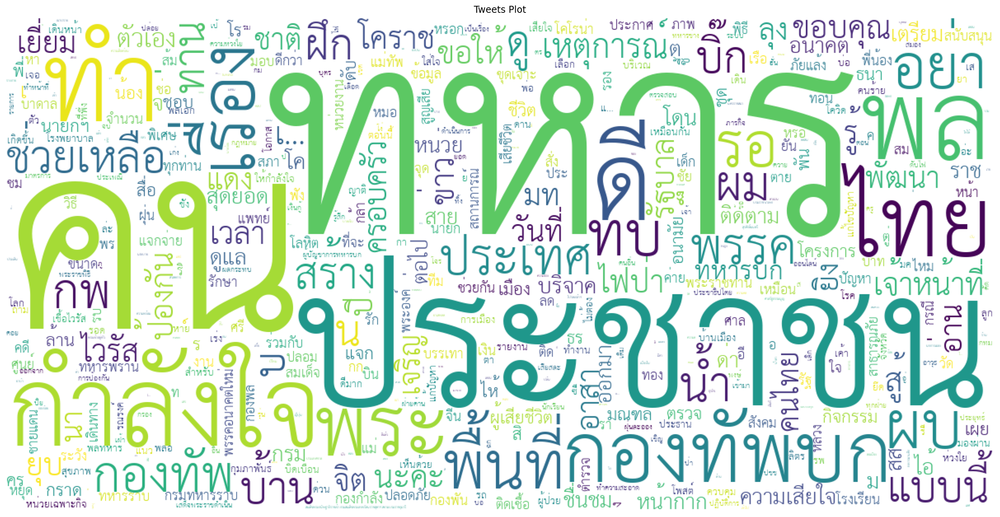

In [ ]:
# Plot tweet words
cleanWords = countWord(words, 500)
plotWord(cleanWords, 500, 'Tweets Plot', tweet = True)

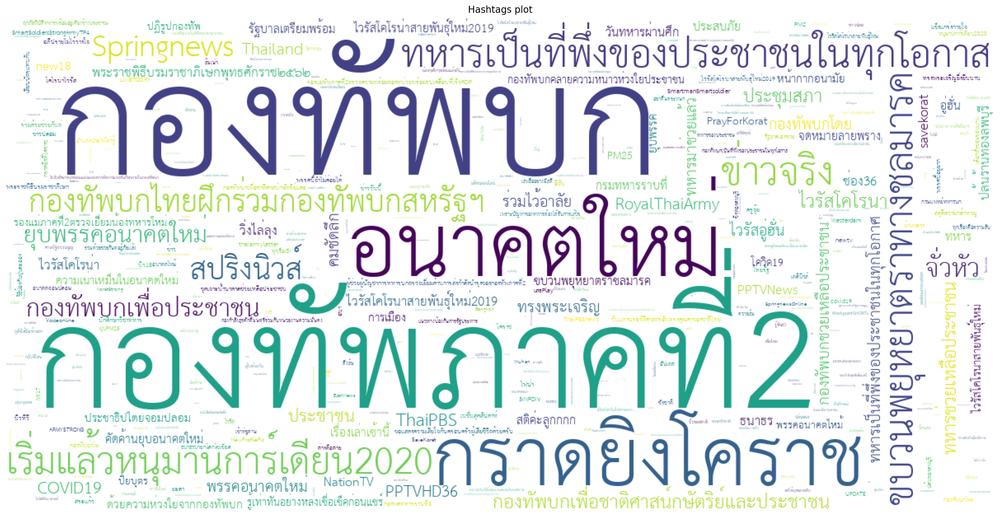

In [ ]:
# Hashtags
hashtags = df['hashtag'].tolist() #Convert to list

# Plot word cloud
cleanHashtags = countWord(hashtags, 500)
plotWord(cleanHashtags, 500, 'Hashtags plot', tweet = False)

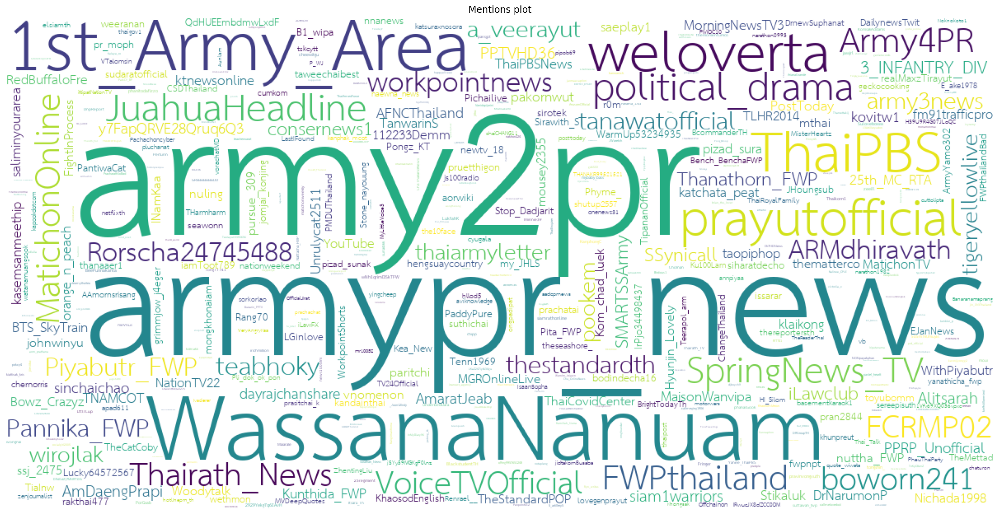

In [ ]:
# Mentions
mentions = df['mention'].tolist()

# Plot word cloud
cleanMentions = countWord(mentions, 500)
plotWord(cleanMentions, 500, 'Mentions plot', tweet = False)